3. Elabore um experimento para avaliar o desempenho comparativo de filtros FIR utilizando as seguintes janelas: retangular, triangular, hanning, hamming, blackman. Para realização dos testes, escolha um arquivo de áudio de sua preferência, pode ser de uma conversação ou uma locução, e faça a “contaminação” com um sinal oriundo do barulho gerado por um ar-condicionado com amplitude igual a 200 mVpp. O objetivo do experimento é projetar um filtro que seja capaz de separar as informações da voz e do ruído do ar-condicionado.


- Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo
- Exibir o espectro de frequência do sinal com ruído antes da filtragem;
- Exibir o espectro de frequência do sinal com ruído após a filtragem para cada janela;
- Exibir o sinal filtrado no domínio do tempo para cada janela;
- Realizar o teste auditivo do áudio antes e após a filtragem.


In [1]:
!pip install display

  Preparing metadata (setup.py) ... done
  Created wheel for display: filename=display-1.0.0-py3-none-any.whl size=1379 sha256=6880e51b06def8372773a1d0c894108489eb60686bcf602780a47361f61082b9
  Stored in directory: /root/.cache/pip/wheels/32/aa/e3/5baec4e60aa11354c95a52649ca7a9cb49fcb869bddf5a33cb
Successfully built display


In [44]:
import numpy as np
import scipy.io.wavfile as wav
import scipy.signal as signal
import matplotlib.pyplot as plt
import IPython.display as ipd
from matplotlib import style
from IPython.display import display, Audio
import os

In [3]:
# 1. Carregar o áudio limpo
sample_rate, clean_audio = wav.read('audio.wav')

# Exibir informações
print(f"Taxa de amostragem: {sample_rate} Hz")
print(f"Dimensão dos dados: {clean_audio.shape}")
print(f"Tipo dos dados: {clean_audio.dtype}")

Taxa de amostragem: 16000 Hz
Dimensão dos dados: (312960,)
Tipo dos dados: int16


In [4]:
# Converter para mono e normalizar
if len(clean_audio.shape) > 1:
    clean_audio = np.mean(clean_audio, axis=1)

clean_audio = clean_audio.astype(np.float32) / np.max(np.abs(clean_audio))

# 2. Gerar ruído de ar-condicionado
def generate_ac_noise(length, sample_rate, amplitude_pp):
    # Gerar ruído branco
    noise = np.random.normal(0, 1, length)

    # Filtrar para simular ruído de ar-condicionado (low-pass 300 Hz)
    nyq = 0.5 * sample_rate
    cutoff = 300 / nyq
    b, a = signal.butter(4, cutoff, btype='low')
    filtered_noise = signal.lfilter(b, a, noise)

    # Normalizar para amplitude 200 mVpp (0.2 na escala normalizada)
    filtered_noise = filtered_noise / np.max(np.abs(filtered_noise)) * (amplitude_pp/2)
    return filtered_noise

In [5]:
# Gerar e adicionar ruído
noise = generate_ac_noise(len(clean_audio), sample_rate, 0.5)
noisy_audio = clean_audio + noise
# noisy_audio = noisy_audio / np.max(np.abs(noisy_audio))

# Converter noisy_audio de volta para int16
noisy_audio_int16 = (noisy_audio * 32767).astype(np.int16)

# Salvar o sinal contaminado como sinal_contaminado.wav
wav.write('sinal_contaminado.wav', sample_rate, noisy_audio_int16)

In [6]:
noise_normalized = np.int16(noise / np.max(np.abs(noise)) * 32767)

# Salvar o sinal em um arquivo .wav
wav.write('ar_condicionado.wav', sample_rate, noise_normalized)


In [7]:
fs_clean, bc_clean = wav.read('audio.wav')
bc_clean = bc_clean.astype(np.float32) / np.max(np.abs(bc_clean))

fs_noisy, bc_noisy = wav.read('ar_condicionado.wav')
bc_noisy = bc_noisy.astype(np.float32) / np.max(np.abs(bc_noisy))

fs, bc = wav.read('sinal_contaminado.wav')
bc = bc.astype(np.float32) / np.max(np.abs(bc))

print('clean')
display(Audio(bc_clean, rate=fs_clean))

print('noise')
display(Audio(bc_noisy, rate=fs_noisy))

print('signal noise')
display(Audio(bc, rate=fs))

# Exibir informações
print(f"Taxa de amostragem: {fs} Hz")
print(f"Dimensão dos dados: {bc.shape}")
print(f"Tipo dos dados: {bc.dtype}")


clean


noise


signal noise


Taxa de amostragem: 16000 Hz
Dimensão dos dados: (312960,)
Tipo dos dados: float32


#1. Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo.

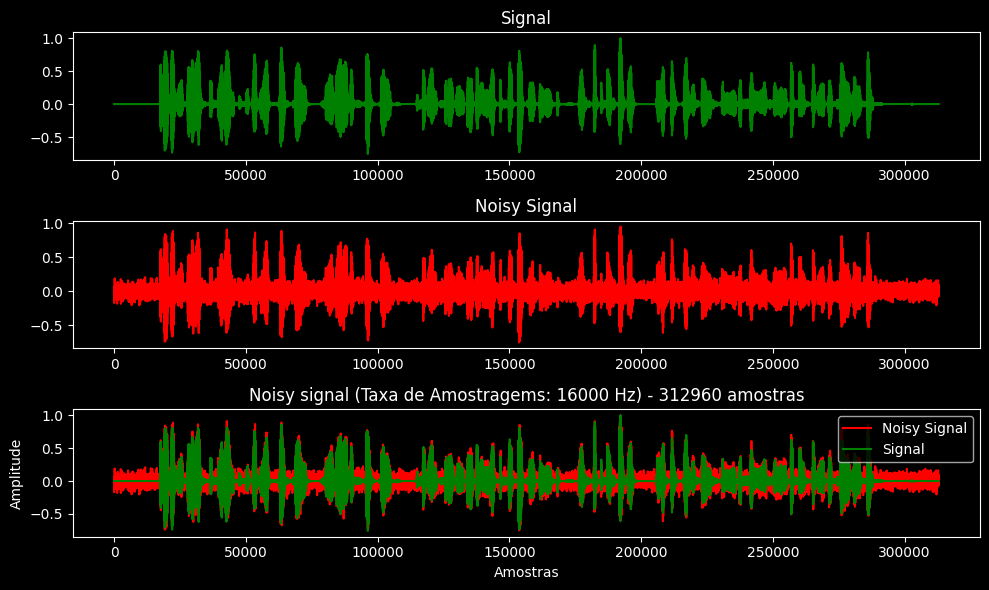

In [10]:
# Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo
style.use('dark_background')
plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
plt.plot(clean_audio,'g-')
plt.title('Signal')

plt.subplot(3, 1, 2)
plt.plot(noisy_audio,'r-')
plt.title('Noisy Signal')
plt.tight_layout()

plt.subplot(3, 1, 3)
plt.plot(noisy_audio, 'r-', label='Noisy Signal')
plt.plot(clean_audio, 'g-',label='Signal')
plt.title('Noisy Signal')
plt.title(f"""Noisy signal (Taxa de Amostragems: {fs} Hz) - {bc.shape[0]} amostras""")
plt.xlabel('Amostras')
plt.ylabel('Amplitude')
plt.legend()
# plt.grid(True)
plt.tight_layout()
from IPython.display import display, Audio
plt.show()

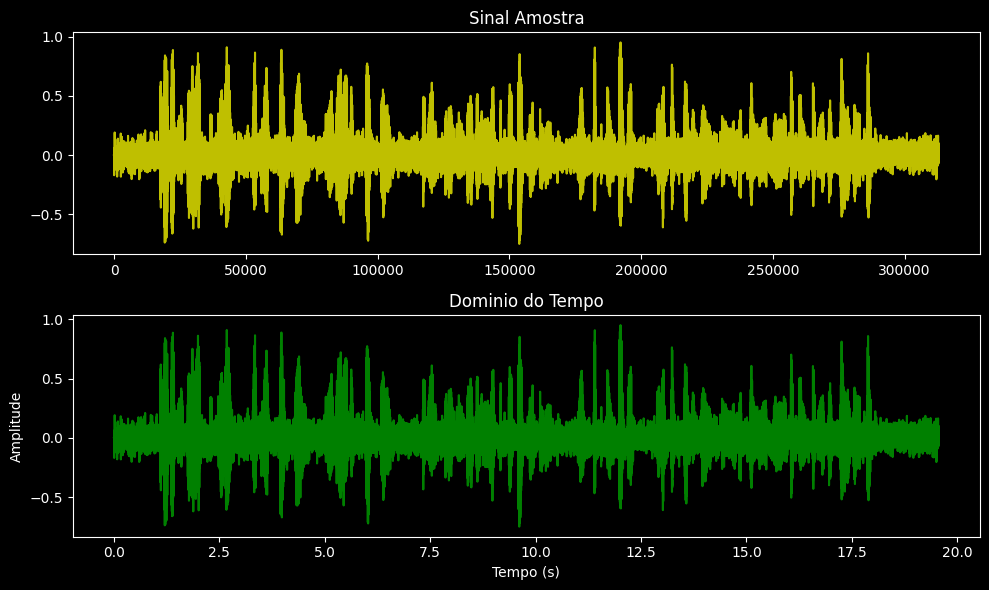

312960 16000
312960 16000
312960 16000


In [15]:
##### Dominio do Tempo
N = len(bc) # passo 1 - Encontrar o tamanho (comprimento)
fs          # passo 2 - Frequencia de Amostragem
T = 1/fs    # passo 3 - Vetor de Tempo
t = np.arange(0, N/fs, T)

plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
plt.plot(noisy_audio, 'y')
plt.title('Sinal Amostra')

plt.subplot(2, 1, 2)
plt.plot(t,noisy_audio,'g-')
plt.title('Dominio do Tempo')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

print(len(clean_audio),sample_rate)
print(len(noisy_audio),sample_rate)
print(len(bc), fs)

## Dominio da Frequência ( Transformada de Fourier )

In [16]:
# passo 4 - Transformada de Fourier
f = np.fft.fftfreq(N, T) #frequencias eixo horizontal (Hz)
trasnf = np.fft.fft(bc)  # transformada de fourier eixo vertical
transf = np.abs(trasnf)  # modulo da transformada de fourier

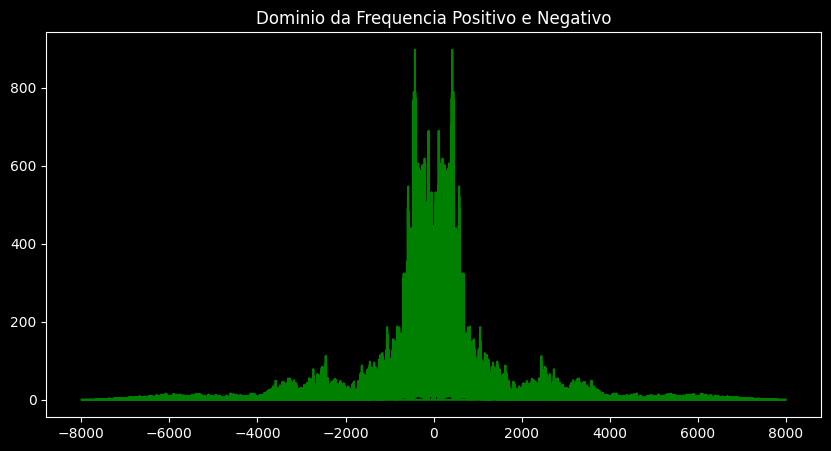

In [17]:
plt.figure(figsize=(10, 5))
plt.plot(f,transf,'g-') # plotando o modulo da transformada de fourier POSITIVO E NEGATIVO
plt.title('Dominio da Frequencia Positivo e Negativo')
plt.show()

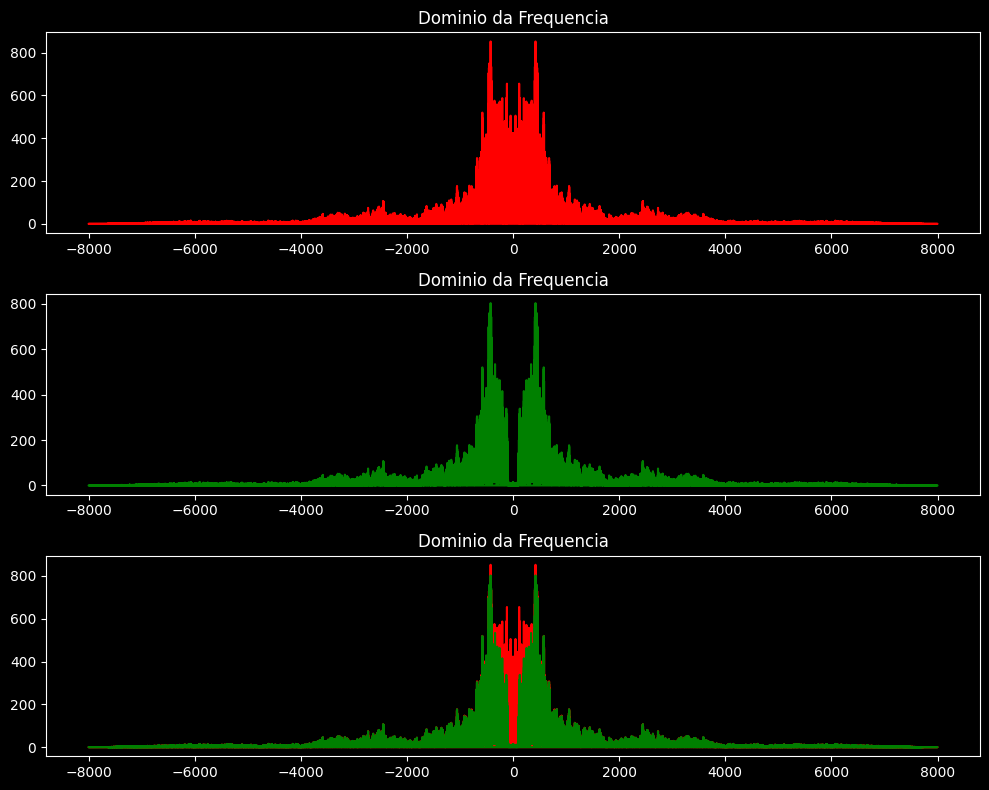

In [22]:
# passo 4 - Transformada de Fourier
trasnf1 = np.fft.fft(clean_audio)  # transformada de fourier eixo vertical
transf1 = np.abs(trasnf1)  # modulo da transformada de fourier

trasnf2 = np.fft.fft(noisy_audio)  # transformada de fourier eixo vertical
transf2 = np.abs(trasnf2)  # modulo da transformada de fourier

plt.figure(figsize=(10, 8))
# style.use('dark_background')
plt.subplot(3, 1, 1)
plt.plot(f,transf2, 'r-') # plotando o modulo da transformada de fourier POSITIVO E NEGATIVO
plt.title('Dominio da Frequencia')

plt.subplot(3, 1, 2)
plt.plot(f,transf1, 'g-') # plotando o modulo da transformada de fourier POSITIVO E NEGATIVO
plt.title('Dominio da Frequencia')

plt.subplot(3, 1, 3)
plt.plot(f,transf2, 'r-') # plotando o modulo da transformada de fourier POSITIVO E NEGATIVO
plt.plot(f,transf1, 'g-') # plotando o modulo da transformada de fourier POSITIVO E NEGATIVO
plt.title('Dominio da Frequencia')
plt.tight_layout()
plt.show()

#2. - Exibir o espectro de frequência do sinal com ruído antes da filtragem

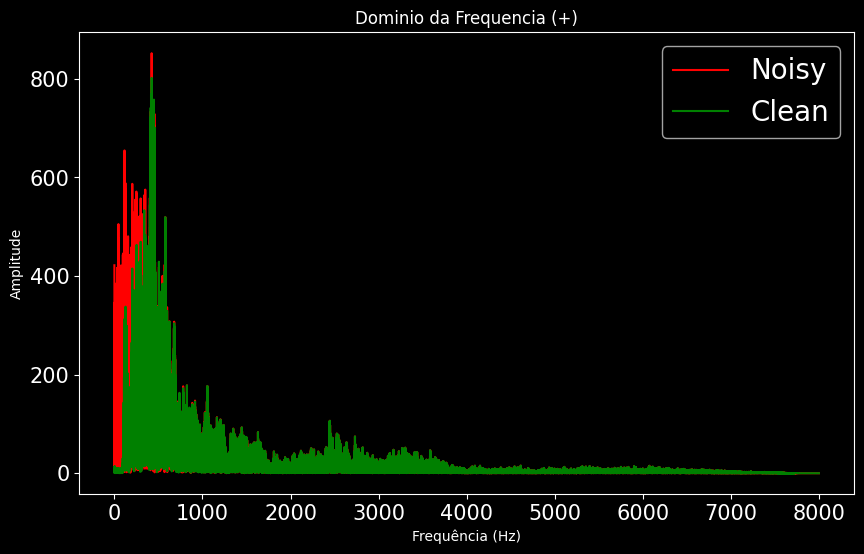

In [23]:
plt.figure(figsize=(10, 6))
plt.rcParams['xtick.labelsize'] = 15
plt.rcParams['ytick.labelsize'] = 15
plt.plot(f[f>0],transf2[f>0],'r-',label='Noisy')    # plotando o modulo da transformada de fourier SOMENTE POSITIVO
plt.plot(f[f>0],transf1[f>0],'g-',label='Clean')    # plotando o modulo da transformada de fourier SOMENTE POSITIVO
plt.title('Dominio da Frequencia (+)')
plt.legend(fontsize = 20)
plt.xlabel('Frequência (Hz)')
plt.ylabel('Amplitude')
# plt.xlim([0,500])
plt.show()


#3. - Exibir o espectro de frequência do sinal com ruído após a filtragem para cada janela

## HighPass


In [37]:
path_window = 'highpass'

In [38]:
# Cálculo do SNR original
def calcular_snr(sinal, ruido):
    potencia_sinal = np.mean(sinal**2)
    potencia_ruido = np.mean(ruido**2)
    return 10 * np.log10(potencia_sinal / potencia_ruido)

snr_original = calcular_snr(clean_audio, noise)

In [39]:
#Configurações dos filtros
cutoff = 450  # Frequência de corte
numtaps = 101  # Número de coeficientes
janelas = [
    ('Retangular', 'boxcar'),
    ('Triangular', 'triang'),
    ('Hanning', 'hann'),
    ('Hamming', 'hamming'),
    ('Blackman', 'blackman')
]


In [40]:
# Espectro do sinal com ruído
spectrum_ruidoso = np.abs(np.fft.fft(noisy_audio))

<Figure size 1800x2000 with 0 Axes>

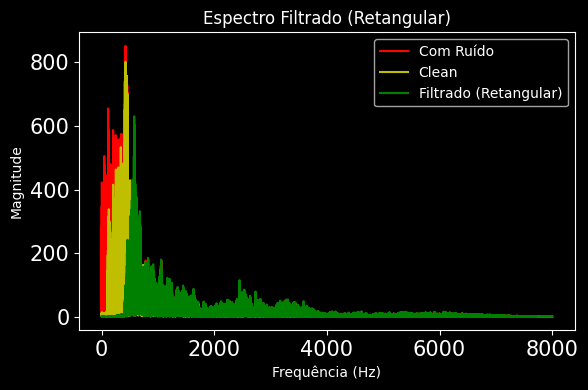

teste


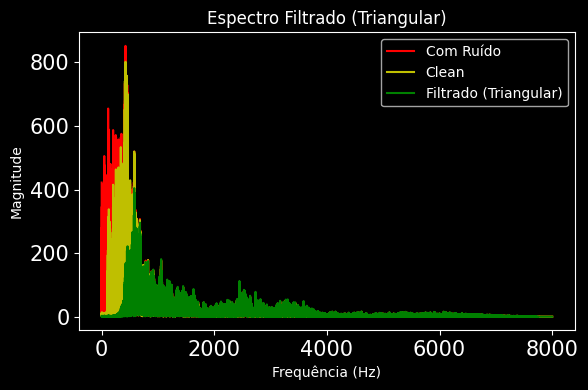

teste


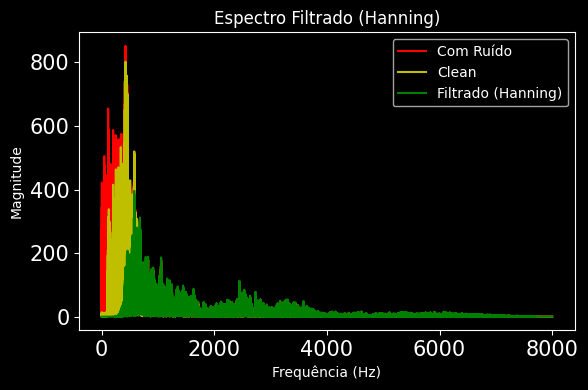

teste


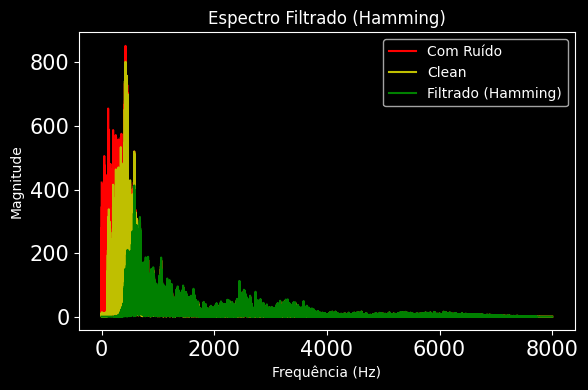

teste


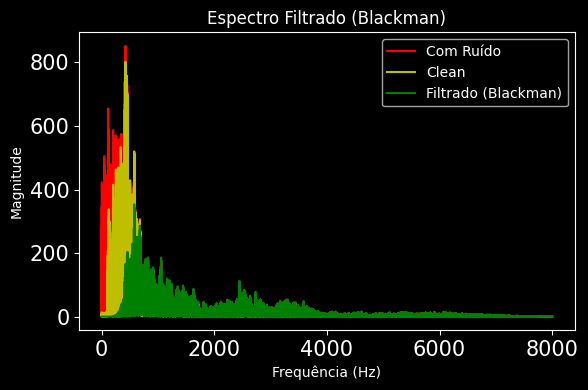

teste


In [41]:
plt.figure(figsize=(18, 20))

# 5. Processamento e gráficos dos filtros
sinais_filtrados = []
resultados = []

for i, (nome, janela) in enumerate(janelas):
    # Projetar e aplicar filtro
    taps = signal.firwin(numtaps, cutoff/sample_rate*2, window=janela, pass_zero='highpass')
    sinal_filtrado = signal.filtfilt(taps, 1.0, bc)
    sinais_filtrados.append((nome, sinal_filtrado))

    # Cálculo do SNR resultante
    ruido_residual = sinal_filtrado - clean_audio
    snr_filtrado = calcular_snr(clean_audio, ruido_residual)

     # Armazenar resultados
    resultados.append([
        nome,
        snr_original,
        snr_filtrado,
        snr_filtrado - snr_original
    ])

    # Gráfico 2: Comparação dos espectros filtrados

    plt.figure(figsize=(6, 4))
    # plt.subplot(len(janelas), 1 ,  i + 1)
    style.use('dark_background')
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    spectrum_filtrado = np.abs(np.fft.fft(sinal_filtrado))
    plt.plot(f[f>0], spectrum_ruidoso[f>0], 'r-', label='Com Ruído')
    plt.plot(f[f>0],transf1[f>0],'y-',label='Clean')
    plt.plot(f[f>0], spectrum_filtrado[f>0], 'g-', label=f'Filtrado ({nome})')
    plt.title(f'Espectro Filtrado ({nome})')
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Magnitude')
    # plt.xlim([0,500])
    plt.tight_layout()
    plt.legend()
    plt.show()

    print('teste')

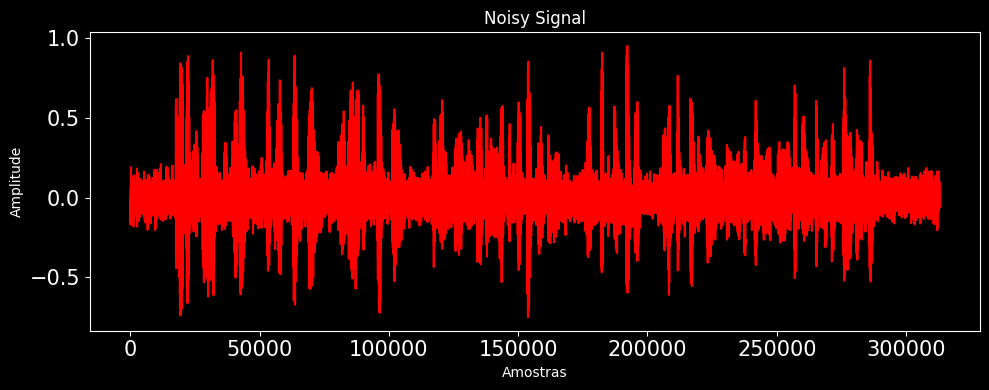

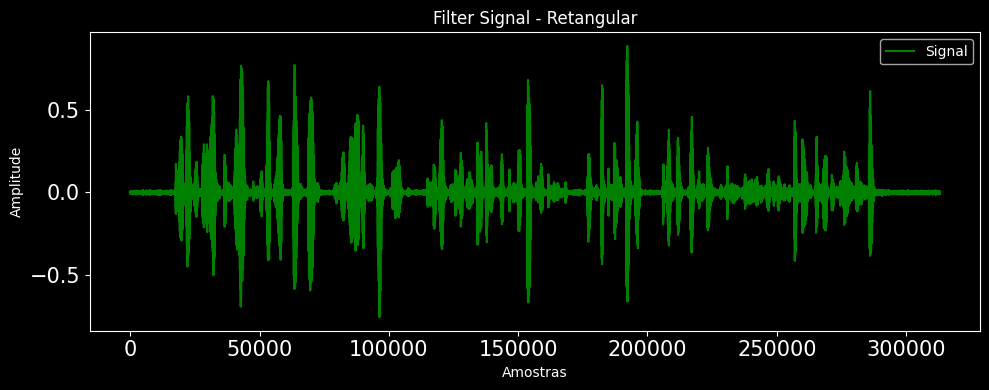

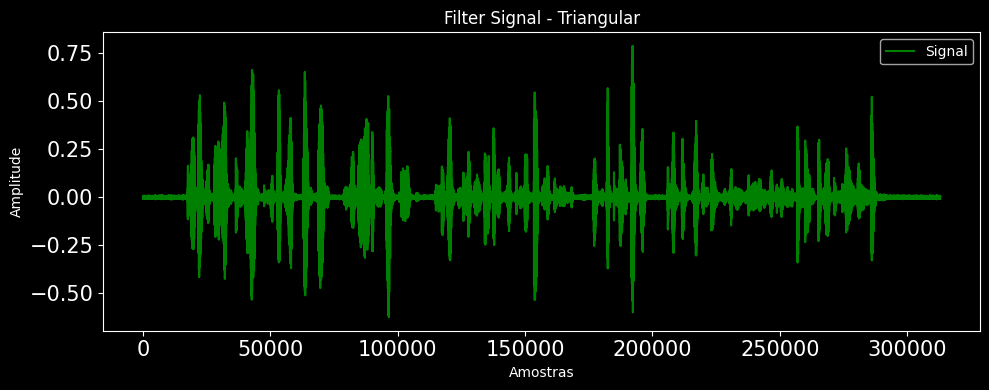

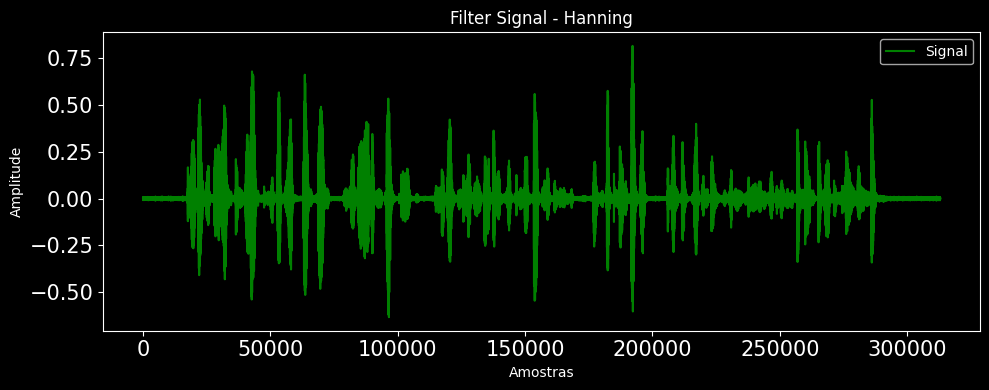

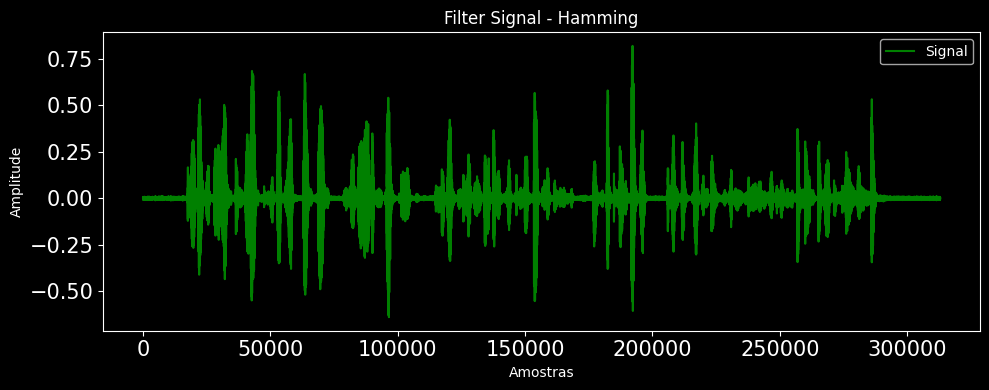

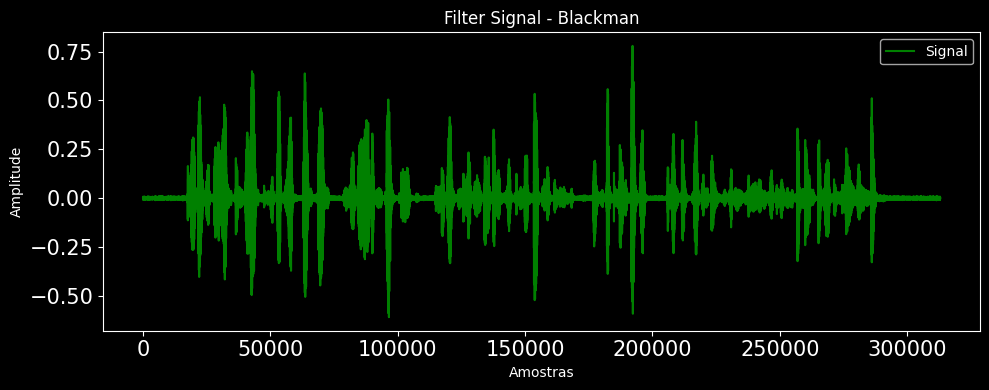

In [42]:
# Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo

plt.figure(figsize=(10, 4))
# plt.subplot(len(janelas)+1, 1, 1)
plt.plot(noisy_audio,'r-')
plt.title('Noisy Signal')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

print('')

for i, (nome, signal_filtrado) in enumerate(sinais_filtrados):
  i=i+1
  plt.figure(figsize=(10, 4))
  # plt.subplot(len(janelas)+1, 1 ,  i + 1)
  # plt.plot(noisy_audio,'r-')
  plt.plot(signal_filtrado, 'g-',label='Signal')
  plt.title(f'Filter Signal - {nome}')
  plt.xlabel('Amostras')
  plt.ylabel('Amplitude')
  plt.legend()
  # plt.grid(True)
  plt.tight_layout()
  # plt.xlim([0,500])
  plt.show()
  print('')

In [45]:
for nome, sinal in sinais_filtrados:
    # print(f"Salvando áudio filtrado com janela {nome}:")
    os.makedirs(path_window, exist_ok=True)
    wav.write(f'{path_window}/filtrado_{nome}.wav', sample_rate, (sinal/np.max(np.abs(sinal)) * 32767).astype(np.int16))


In [46]:
fs, bc = wav.read('sinal_contaminado.wav')

bc = bc.astype(np.float32) / np.max(np.abs(bc))

# Exibir informações
print(f"Taxa de amostragem: {fs} Hz")
print(f"Dimensão dos dados: {bc.shape}")
print(f"Tipo dos dados: {bc.dtype}")

# Play the contaminated audio
ipd.Audio(bc, rate=sample_rate)

Taxa de amostragem: 16000 Hz
Dimensão dos dados: (312960,)
Tipo dos dados: float32


In [47]:
from IPython.display import display, Audio
for nome, sinal in sinais_filtrados:
    fs, bc = wav.read(f'{path_window}/filtrado_{nome}.wav')
    bc = bc.astype(np.float32) / np.max(np.abs(bc))
    print(f'{path_window}/filtrado_{nome}.wav')
    display(Audio(bc, rate=fs))


highpass/filtrado_Retangular.wav


highpass/filtrado_Triangular.wav


highpass/filtrado_Hanning.wav


highpass/filtrado_Hamming.wav


highpass/filtrado_Blackman.wav


In [48]:
from tabulate import tabulate
headers = ["Janela", "SNR Original (dB)", "SNR Filtrado (dB)", "Melhoria (dB)"]
print(tabulate(resultados, headers=headers, tablefmt="grid", floatfmt=".2f"))

resultados_ordenados = sorted(resultados, key=lambda x: x[3], reverse=True)

# Criar string de comparação
ranking = " > ".join([f"{janela[0]} ({janela[3]:.2f} dB)" for janela in resultados_ordenados])

print("\nRanking de Eficiência das Janelas:")
print(ranking + "\n")

+------------+---------------------+---------------------+-----------------+
| Janela     |   SNR Original (dB) |   SNR Filtrado (dB) |   Melhoria (dB) |
+============+=====================+=====================+=================+
| Retangular |                3.31 |                2.53 |           -0.78 |
+------------+---------------------+---------------------+-----------------+
| Triangular |                3.31 |                2.77 |           -0.54 |
+------------+---------------------+---------------------+-----------------+
| Hanning    |                3.31 |                2.64 |           -0.67 |
+------------+---------------------+---------------------+-----------------+
| Hamming    |                3.31 |                2.64 |           -0.68 |
+------------+---------------------+---------------------+-----------------+
| Blackman   |                3.31 |                2.67 |           -0.65 |
+------------+---------------------+---------------------+-----------------+

## passa-banda

In [49]:
path_window = 'bandpass'

In [50]:
# 4. Configurações dos filtros FIR passa-banda
cutoff = [450, 6000]  # Frequências de corte
numtaps = 101        # Número de coeficientes (ímpar para fase linear)
janelas = [
    ('Retangular', 'boxcar'),
    ('Triangular', 'triang'),
    ('Hanning', 'hann'),
    ('Hamming', 'hamming'),
    ('Blackman', 'blackman')
]


<Figure size 1800x1200 with 0 Axes>

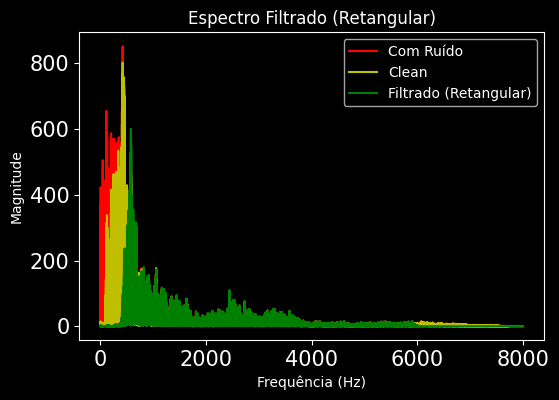

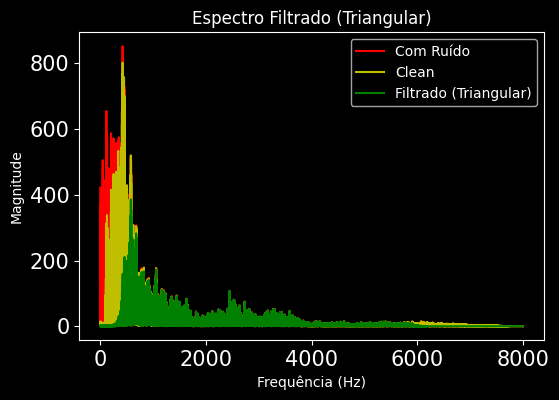

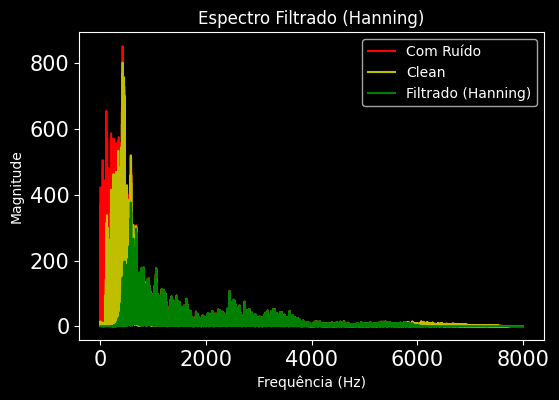

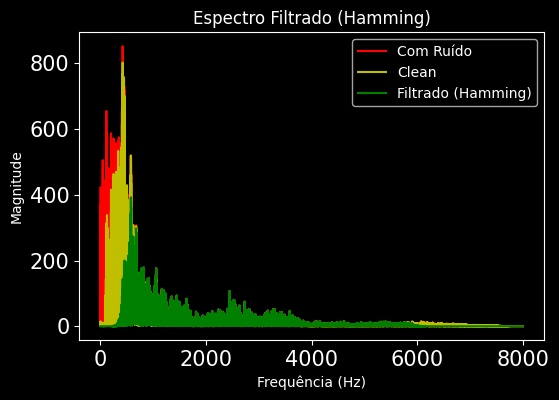

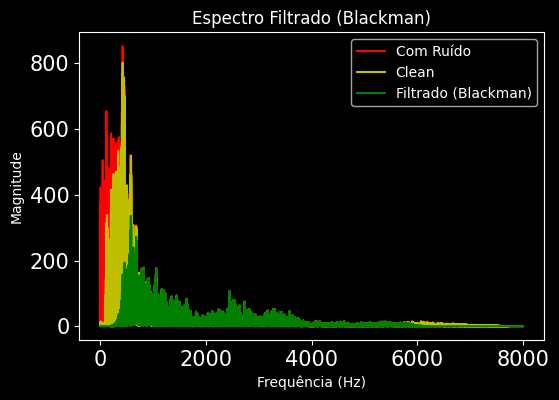

In [51]:
plt.figure(figsize=(18, 12))

# 5. Processamento e gráficos dos filtros
sinais_filtrados = []
resultados = []

for i, (nome, janela) in enumerate(janelas):
    # Projetar e aplicar filtro
    taps = signal.firwin(numtaps, [cutoff[0]/sample_rate*2, cutoff[1]/sample_rate*2],window=janela, pass_zero=False)
    sinal_filtrado = signal.filtfilt(taps, 1.0, noisy_audio)
    sinais_filtrados.append((nome, sinal_filtrado))

    # Cálculo do SNR resultante
    ruido_residual = sinal_filtrado - clean_audio
    snr_filtrado = calcular_snr(clean_audio, ruido_residual)

     # Armazenar resultados
    resultados.append([
        nome,
        snr_original,
        snr_filtrado,
        snr_filtrado - snr_original
    ])

    # Gráfico 2: Comparação dos espectros filtrados
    plt.figure(figsize=(6, 4))
    # plt.subplot(len(janelas), 1 ,  i + 1)
    style.use('dark_background')
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    spectrum_filtrado = np.abs(np.fft.fft(sinal_filtrado))
    plt.plot(f[f>0], spectrum_ruidoso[f>0], 'r-', label='Com Ruído')
    plt.plot(f[f>0],transf1[f>0],'y-',label='Clean')
    plt.plot(f[f>0], spectrum_filtrado[f>0], 'g-', label=f'Filtrado ({nome})')
    plt.title(f'Espectro Filtrado ({nome})')
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Magnitude')
    # plt.xlim([0,500])
    plt.legend()
    plt.show()
    print('')


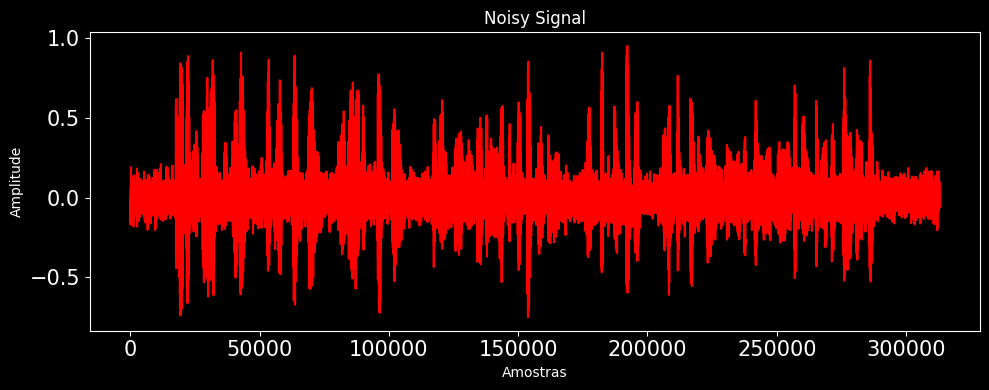

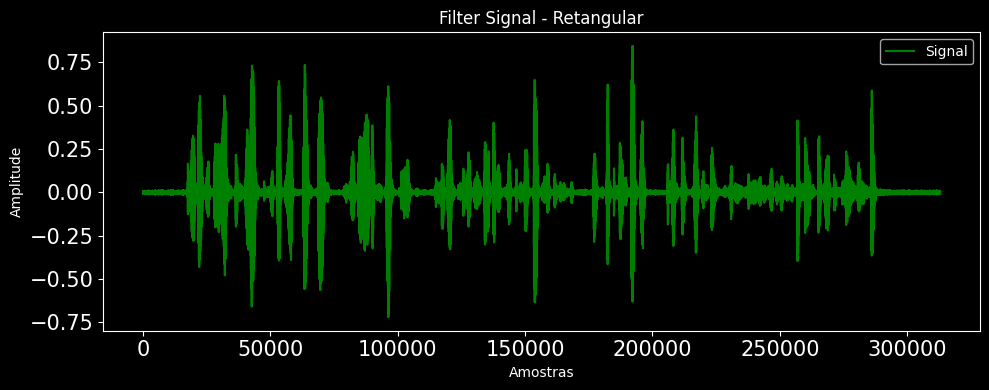

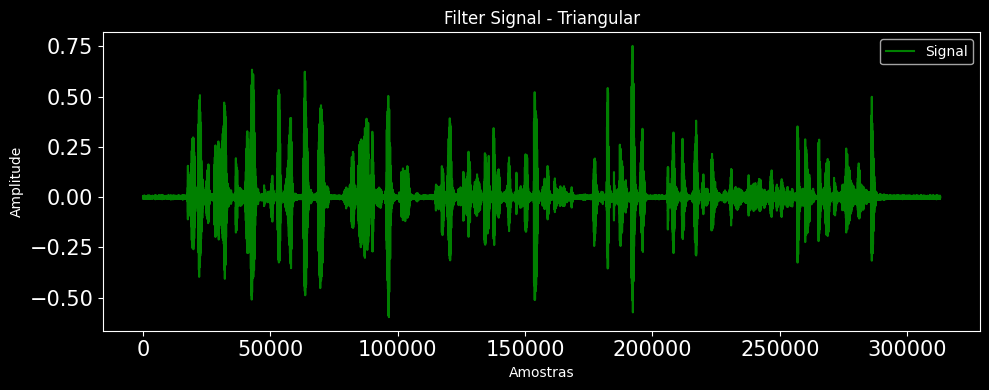

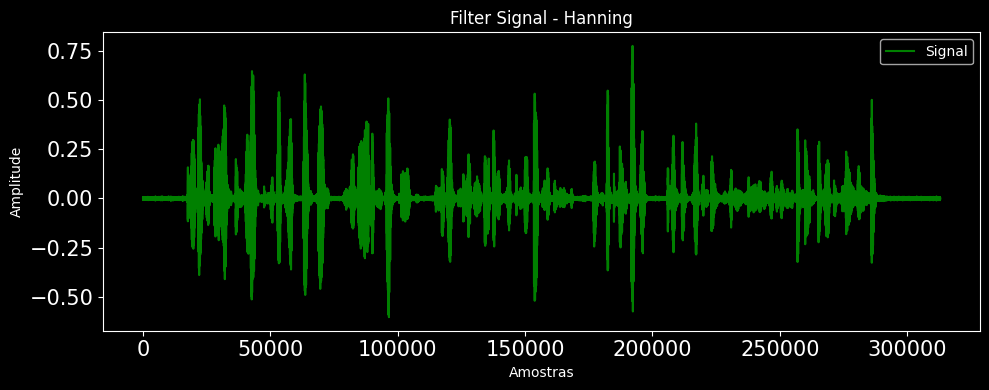

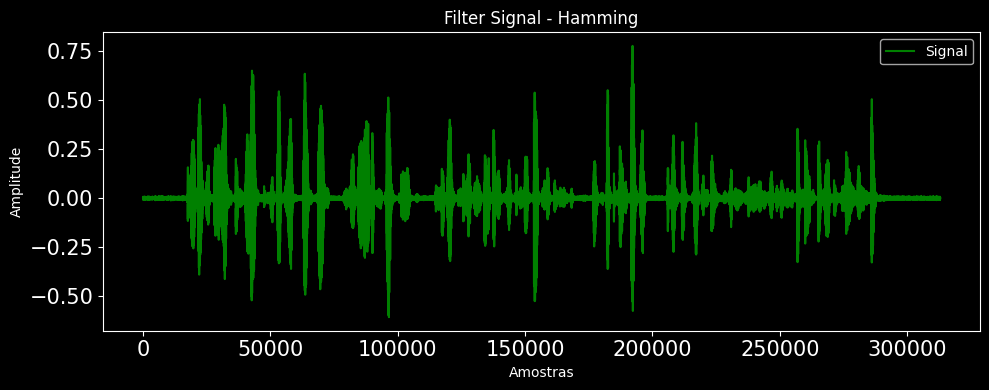

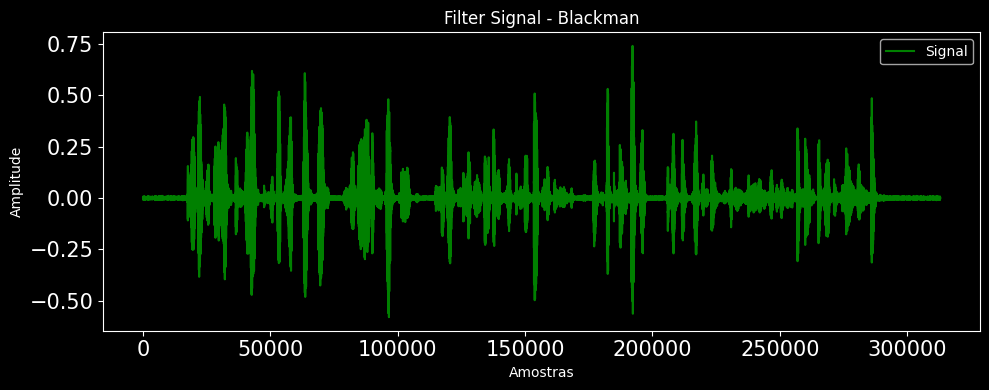

In [53]:
# Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo
plt.figure(figsize=(10, 4))
# plt.subplot(len(janelas)+1, 1, 1)
plt.plot(noisy_audio,'r-')
plt.title('Noisy Signal')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()
print('')

for i, (nome, signal_filtrado) in enumerate(sinais_filtrados):
  i=i+1
  # plt.subplot(len(janelas)+1, 1 ,  i + 1)
  plt.figure(figsize=(10, 4))
  plt.plot(signal_filtrado, 'g-',label='Signal')
  plt.title(f'Filter Signal - {nome}')
  plt.xlabel('Amostras')
  plt.ylabel('Amplitude')
  plt.legend()
  # plt.grid(True)
  plt.tight_layout()
  plt.show()
  print('')

In [ ]:
for nome, sinal in sinais_filtrados:
    # print(f"Salvando áudio filtrado com janela {nome}:")
    os.makedirs(path_window, exist_ok=True)
    wav.write(f'{path_window}/filtrado_{nome}.wav', sample_rate, (sinal/np.max(np.abs(sinal)) * 32767).astype(np.int16))

In [ ]:
fs, bc = wav.read('sinal_contaminado.wav')

bc = bc.astype(np.float32) / np.max(np.abs(bc))

# Exibir informações
print(f"Taxa de amostragem: {fs} Hz")
print(f"Dimensão dos dados: {bc.shape}")
print(f"Tipo dos dados: {bc.dtype}")

# Play the contaminated audio
ipd.Audio(bc, rate=sample_rate)

Taxa de amostragem: 16000 Hz
Dimensão dos dados: (312960,)
Tipo dos dados: float32


In [ ]:
from IPython.display import display, Audio
for nome, sinal in sinais_filtrados:
    fs, bc = wav.read(f'{path_window}/filtrado_{nome}.wav')
    bc = bc.astype(np.float32) / np.max(np.abs(bc))
    print(f'{path_window}/filtrado_{nome}.wav')
    display(Audio(bc, rate=fs))

bandpass/filtrado_Retangular.wav


bandpass/filtrado_Triangular.wav


bandpass/filtrado_Hanning.wav


bandpass/filtrado_Hamming.wav


bandpass/filtrado_Blackman.wav


In [ ]:
from tabulate import tabulate
headers = ["Janela", "SNR Original (dB)", "SNR Filtrado (dB)", "Melhoria (dB)"]
print(tabulate(resultados, headers=headers, tablefmt="grid", floatfmt=".2f"))

resultados_ordenados = sorted(resultados, key=lambda x: x[3], reverse=True)

# Criar string de comparação
ranking = " > ".join([f"{janela[0]} ({janela[3]:.2f} dB)" for janela in resultados_ordenados])

print("\nRanking de Eficiência das Janelas:")
print(ranking + "\n")

+------------+---------------------+---------------------+-----------------+
| Janela     |   SNR Original (dB) |   SNR Filtrado (dB) |   Melhoria (dB) |
+============+=====================+=====================+=================+
| Retangular |                3.58 |                2.53 |           -1.04 |
+------------+---------------------+---------------------+-----------------+
| Triangular |                3.58 |                2.68 |           -0.89 |
+------------+---------------------+---------------------+-----------------+
| Hanning    |                3.58 |                2.57 |           -1.01 |
+------------+---------------------+---------------------+-----------------+
| Hamming    |                3.58 |                2.56 |           -1.01 |
+------------+---------------------+---------------------+-----------------+
| Blackman   |                3.58 |                2.58 |           -1.00 |
+------------+---------------------+---------------------+-----------------+

## bandstop

In [55]:
path_window = 'bandstop'

In [56]:
# 4. Configurações dos filtros FIR passa-banda
cutoff = [10, 450]   # Banda de rejeição (100 Hz a 300 Hz)
numtaps = 51        # Número de coeficientes (ímpar para fase linear)
janelas = [
    ('Retangular', 'boxcar'),
    ('Triangular', 'triang'),
    ('Hanning', 'hann'),
    ('Hamming', 'hamming'),
    ('Blackman', 'blackman')
]


<Figure size 1800x1200 with 0 Axes>

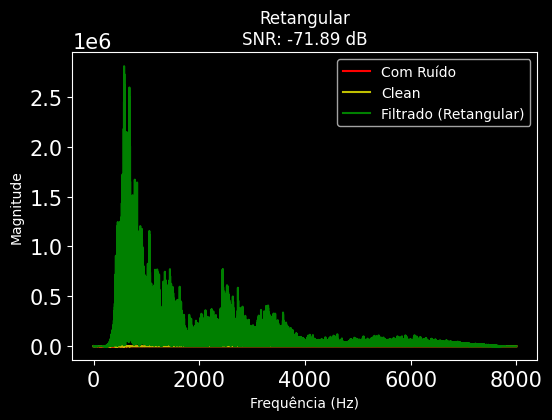

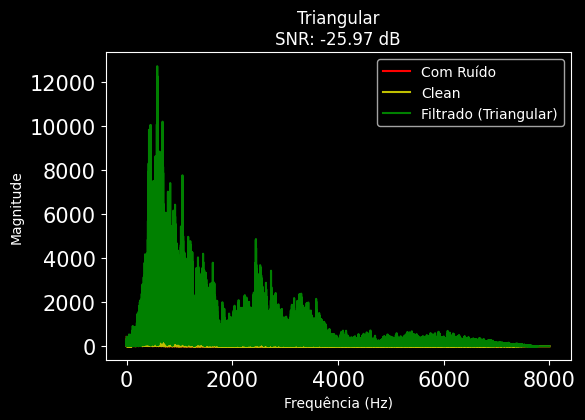

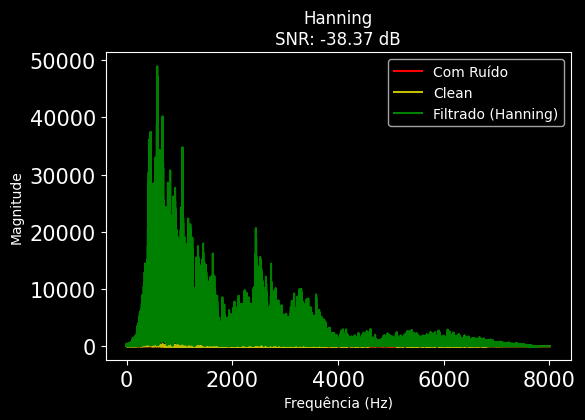

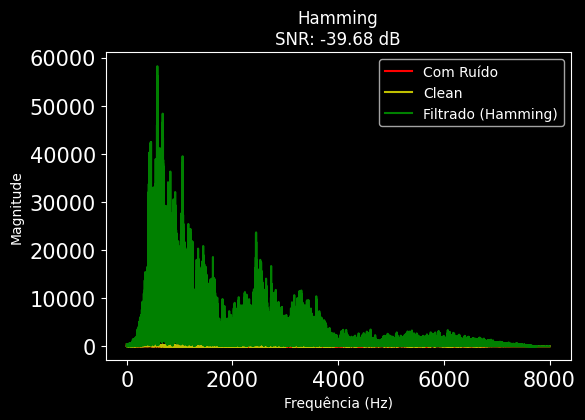

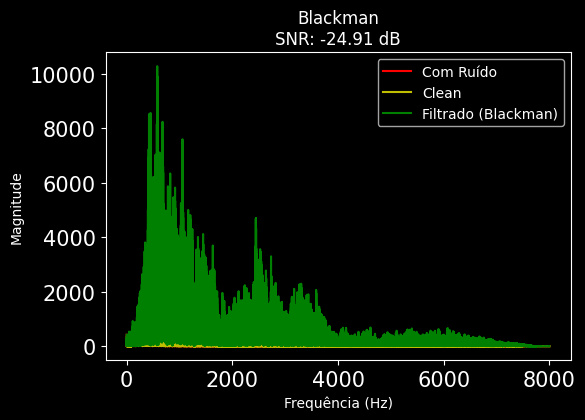

In [58]:
# 5. Processamento e gráficos dos filtros
plt.figure(figsize=(18, 12))

sinais_filtrados = []
resultados = []

for i, (nome, janela) in enumerate(janelas):
    # Projetar e aplicar filtro
    taps = signal.firwin(numtaps, [cutoff[0]/sample_rate*2, cutoff[1]/sample_rate*2],window=janela, pass_zero='bandstop')
    sinal_filtrado = signal.filtfilt(taps, 1.0, noisy_audio)
    sinais_filtrados.append((nome, sinal_filtrado))

    # Cálculo do SNR resultante
    ruido_residual = sinal_filtrado - clean_audio
    snr_filtrado = calcular_snr(clean_audio, ruido_residual)

     # Armazenar resultados
    resultados.append([
        nome,
        snr_original,
        snr_filtrado,
        snr_filtrado - snr_original
    ])
    # Gráfico 2: Comparação dos espectros filtrados

    plt.figure(figsize=(6, 4))
    # plt.subplot(len(janelas), 1 ,  i + 1)
    style.use('dark_background')
    plt.rcParams['xtick.labelsize'] = 15
    plt.rcParams['ytick.labelsize'] = 15
    spectrum_filtrado = np.abs(np.fft.fft(sinal_filtrado))
    plt.plot(f[f>0], spectrum_ruidoso[f>0], 'r-', label='Com Ruído')
    plt.plot(f[f>0], transf1[f>0],'y-',label='Clean')
    plt.plot(f[f>0], spectrum_filtrado[f>0], 'g-', label=f'Filtrado ({nome})')
    plt.title(f'{nome}\nSNR: {snr_filtrado:.2f} dB')
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Magnitude')
    # plt.xlim([0,500])
    plt.legend()
    plt.show()
    print('')

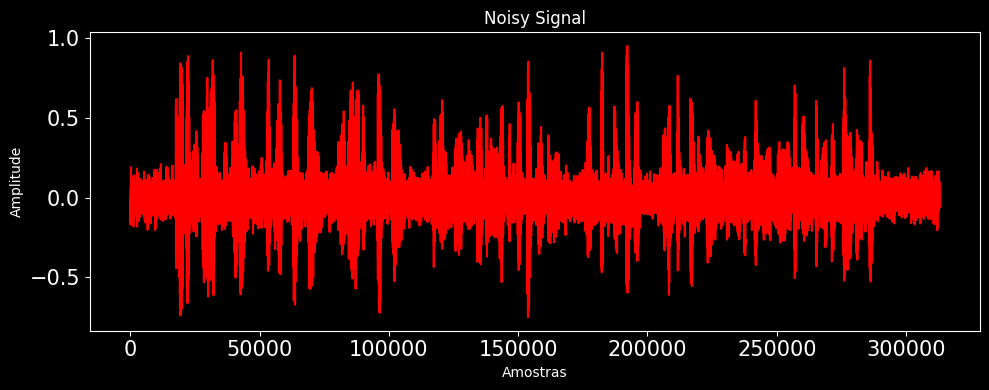

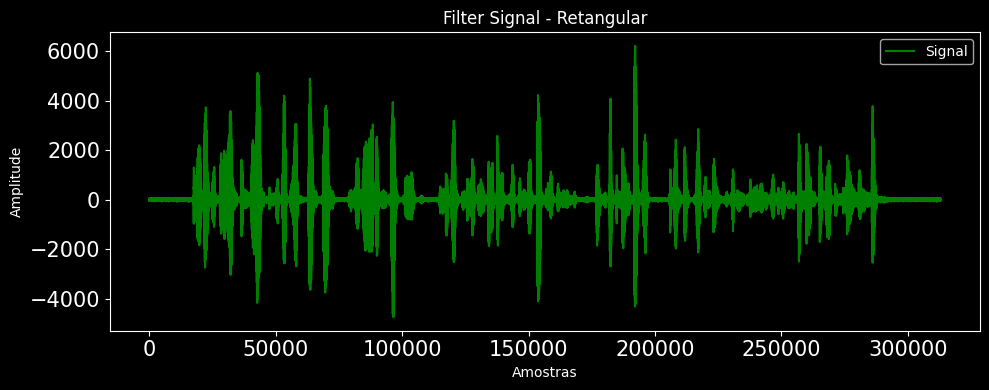

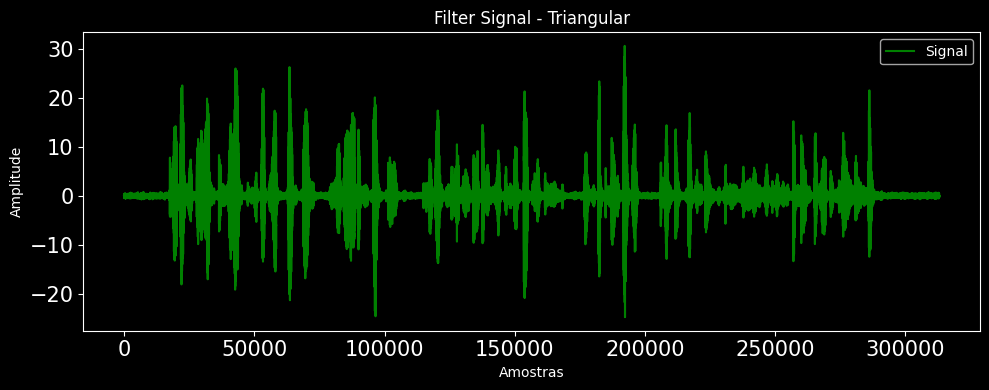

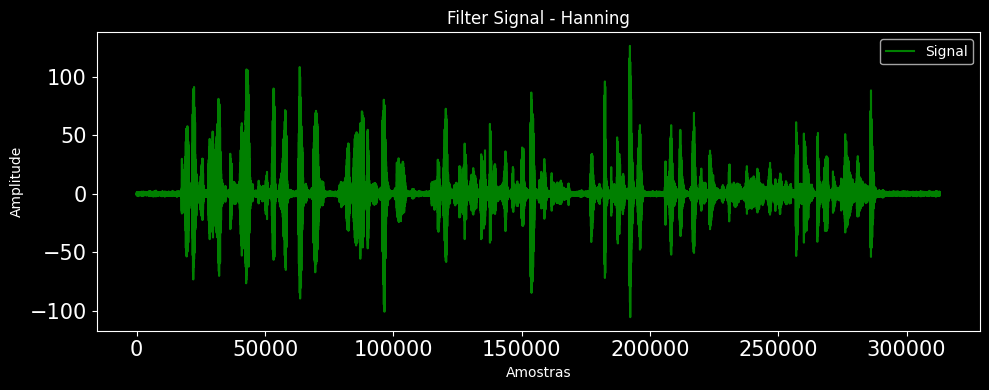

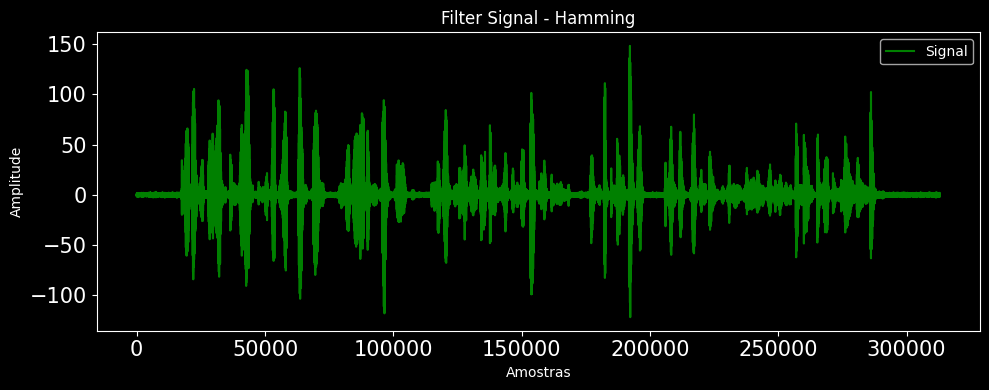

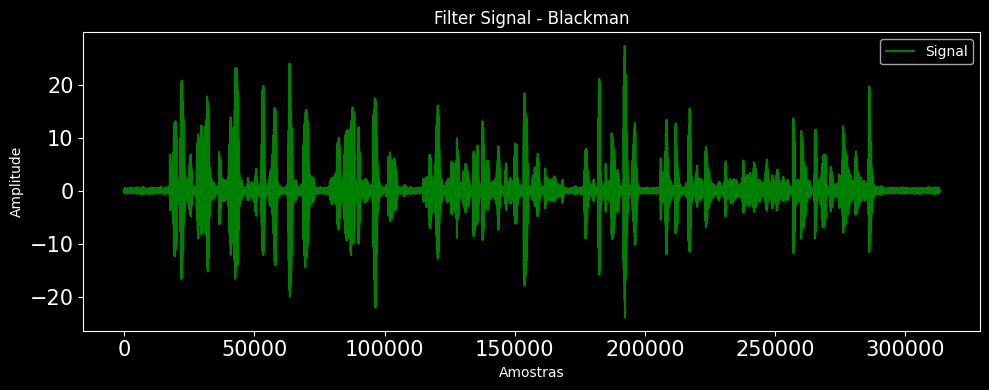

In [60]:
# Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo
plt.figure(figsize=(10, 4))
# plt.subplot(len(janelas)+1, 1, 1)
plt.plot(noisy_audio,'r-')
plt.title('Noisy Signal')
plt.xlabel('Amostras')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()
print('')

for i, (nome, signal_filtrado) in enumerate(sinais_filtrados):
  i=i+1
  plt.figure(figsize=(10, 4))
  # plt.subplot(len(janelas)+1, 1 ,  i + 1)
  plt.plot(signal_filtrado, 'g-',label='Signal')
  plt.title(f'Filter Signal - {nome}')
  plt.xlabel('Amostras')
  plt.ylabel('Amplitude')
  plt.legend()
  # plt.grid(True)
  plt.tight_layout()
  plt.show()
  print('')

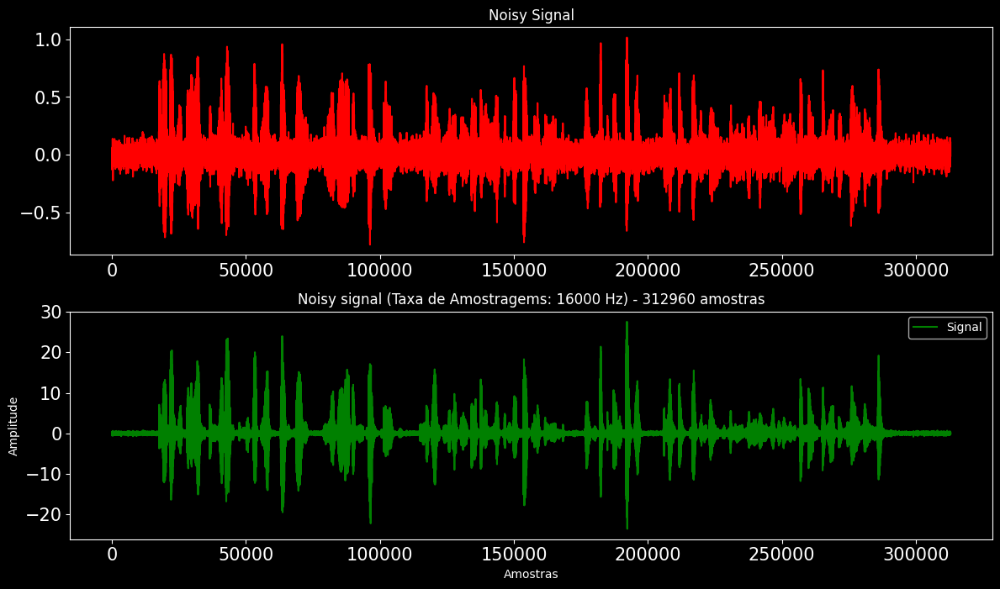

In [ ]:
# Exibir o sinal sem ruído e o sinal com o ruído antes da filtragem no domínio do tempo
# style.use('dark_background')
plt.figure(figsize=(12, 10))
plt.subplot(3, 1, 1)
plt.plot(noisy_audio,'r-')
plt.title('Noisy Signal')
plt.tight_layout()

plt.subplot(3, 1, 2)
plt.plot(sinal_filtrado, 'g-',label='Signal')
plt.title('Noisy Signal')
plt.title(f"""Noisy signal (Taxa de Amostragems: {fs} Hz) - {bc.shape[0]} amostras""")
plt.xlabel('Amostras')
plt.ylabel('Amplitude')
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.show()

In [61]:
for nome, sinal in sinais_filtrados:
    # print(f"Salvando áudio filtrado com janela {nome}:")
    os.makedirs(path_window, exist_ok=True)
    wav.write(f'{path_window}/filtrado_{nome}.wav', sample_rate, (sinal/np.max(np.abs(sinal)) * 32767).astype(np.int16))

In [62]:
fs, bc = wav.read('sinal_contaminado.wav')
bc = bc.astype(np.float32) / np.max(np.abs(bc))

# Exibir informações
print(f"Taxa de amostragem: {fs} Hz")
print(f"Dimensão dos dados: {bc.shape}")
print(f"Tipo dos dados: {bc.dtype}")

# Play the contaminated audio
ipd.Audio(bc, rate=sample_rate)

Taxa de amostragem: 16000 Hz
Dimensão dos dados: (312960,)
Tipo dos dados: float32


In [63]:
from IPython.display import display, Audio
for nome, sinal in sinais_filtrados:
    fs, bc = wav.read(f'{path_window}/filtrado_{nome}.wav')
    bc = bc.astype(np.float32) / np.max(np.abs(bc))
    print(f'{path_window}/filtrado_{nome}.wav')
    display(Audio(bc, rate=fs))

bandstop/filtrado_Retangular.wav


bandstop/filtrado_Triangular.wav


bandstop/filtrado_Hanning.wav


bandstop/filtrado_Hamming.wav


bandstop/filtrado_Blackman.wav


In [ ]:
# 6. Tabela de resultados
from tabulate import tabulate
headers = ["Janela", "SNR Original (dB)", "SNR Filtrado (dB)", "Melhoria (dB)"]
print(tabulate(resultados, headers=headers, tablefmt="grid", floatfmt=".2f"))

resultados_ordenados = sorted(resultados, key=lambda x: x[3], reverse=True)

# Criar string de comparação
ranking = " > ".join([f"{janela[0]} ({janela[3]:.2f} dB)" for janela in resultados_ordenados])

print("\nRanking de Eficiência das Janelas:")
print(ranking + "\n")


+------------+---------------------+---------------------+-----------------+
| Janela     |   SNR Original (dB) |   SNR Filtrado (dB) |   Melhoria (dB) |
+============+=====================+=====================+=================+
| Retangular |                3.58 |              -71.88 |          -75.46 |
+------------+---------------------+---------------------+-----------------+
| Triangular |                3.58 |              -25.97 |          -29.54 |
+------------+---------------------+---------------------+-----------------+
| Hanning    |                3.58 |              -38.36 |          -41.94 |
+------------+---------------------+---------------------+-----------------+
| Hamming    |                3.58 |              -39.68 |          -43.26 |
+------------+---------------------+---------------------+-----------------+
| Blackman   |                3.58 |              -24.90 |          -28.48 |
+------------+---------------------+---------------------+-----------------+